### Spatial Control Demo

In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
from omegaconf import OmegaConf
from PIL import Image
import torch

from readout_guidance import rg_helpers
from script_spatial import set_edits_control

**Load the Stable Diffusion Pipeline and Readout Head**

The demo is pre-loaded to the SDXL pose readout head. Change the hyperparameters in the `config/spatial.yaml` file to try other control types. To try other base models, change `model_path` and `res`. To try other heads, change `aggregation_kwargs.aggregation_weights`. 

In [2]:
device = "cuda"
config_path = "configs/spatial.yaml"
config = OmegaConf.load(config_path)

In [3]:
# Load pipeline
pipeline, dtype = rg_helpers.load_pipeline(config, device)
batch_size = config["batch_size"]
latent_height = latent_width = pipeline.unet.config.sample_size
height = width = latent_height * pipeline.vae_scale_factor
image_dim = (width, height)
latent_dim = (latent_height, latent_width)

# Create edit config and load aggregation network
edits = rg_helpers.get_edits(config, device, dtype)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Using output head with 3 channels


**Optional: Load Conditional Model**

If you would like to try Readout Guidance on top of a conditional model like T2IAdapter, uncomment the lines below.  Note that ControlNet is incompatible with the base SDXL config, since there are only weights available for SDv1-5. Make sure you also correctly switch out the base model when using ControlNet.

In [4]:
# Load ControlNet (SDv1-5) 
# config["controlnet_path"] = "lllyasviel/control_v11p_sd15_openpose"
# pipeline, dtype = rg_helpers.load_controlnet_pipeline(config, device)

# Load T2IAdapter (SDXL)
# config["adapter_path"] = "TencentARC/t2i-adapter-openpose-sdxl-1.0"
# pipeline, dtype = rg_helpers.load_adapter_pipeline(config, device)

**Load the Control Input**

To try other control inputs, change the `prompt` and `control_path`. To find examples of other inputs, look at the json files in `annotations/spatial`.

In [5]:
prompt = "a group of people playing with Frisbee's on the grass"
control_path = "data/spatial/pose/000000013291.png"

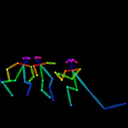

In [6]:
# Add control to edits
control_image = Image.open(control_path)
edits = set_edits_control(
    edits,
    control_image, 
    image_dim, 
    latent_dim,
    device
)
control_image.resize(latent_dim[::-1])

**Run Readout Guidance**

Run text-to-image generation. By default, the config `batch_size` is set to 2, where the left image is the result *without* readout guidance and the right image is the result *with* readout guidance. The cell will also log the readout guidance loss (if not applied, displayed as "N/A"), the predicted x0, and the predicted readouts.

Readout Guidance Loss N/A: : 90it [01:50,  2.66it/s]

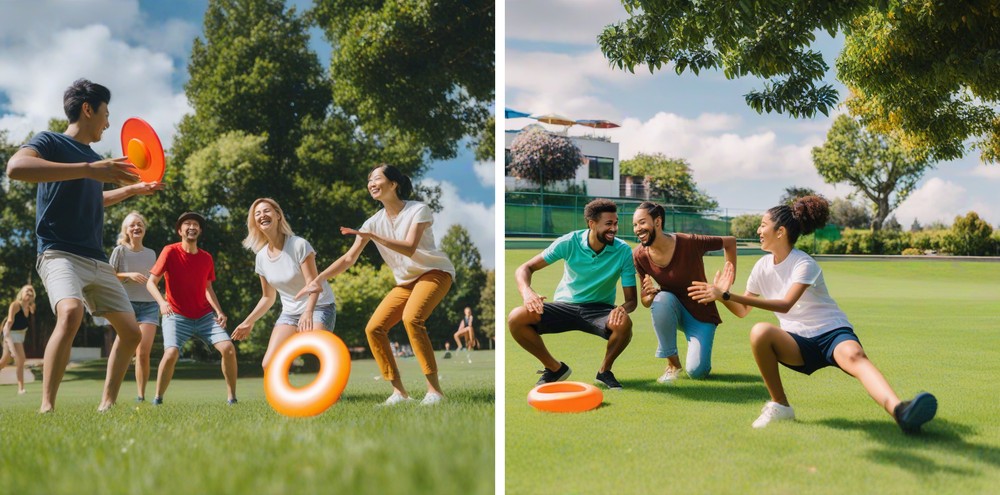

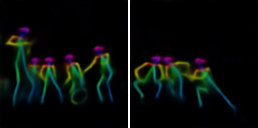

Readout Guidance Loss N/A: : 100it [01:54,  1.15s/it]


In [7]:
generator = torch.Generator().manual_seed(config["seed"])
prompts, latents = rg_helpers.get_prompts_latents(
    pipeline,
    prompt,
    batch_size, 
    config["seed"],
    latent_dim,
    device,
    dtype,
)
images, results = rg_helpers.run_preset_generation(
    pipeline, 
    prompts, 
    latents,
    edits,
    latent_dim=latent_dim,
    **config["generation_kwargs"]
)

a group of people playing with Frisbee's on the grass

Without Readout Guidance:


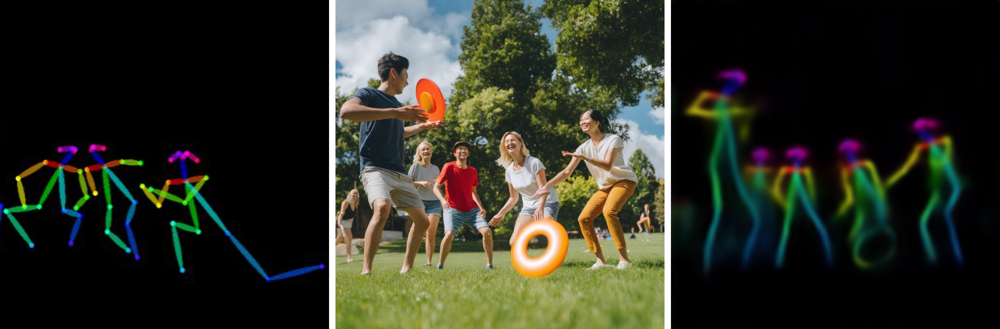

With Readout Guidance:


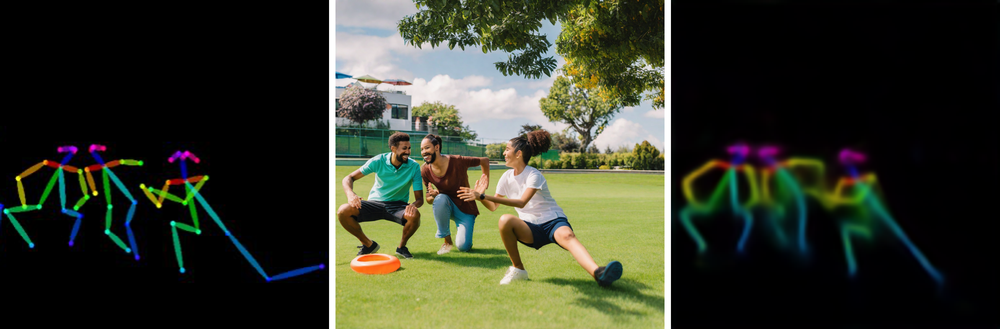

In [8]:
orig_row = [
    control_image.resize(image_dim),
    Image.fromarray(images[0]).resize(image_dim),
    results[1].resize(image_dim)
]
rg_row = [
    control_image.resize(image_dim), 
    Image.fromarray(images[1]).resize(image_dim),
    results[2].resize(image_dim)
]

prompt_sep = "=" * 60
print(prompt_sep)
print(prompt)
print(prompt_sep)
print()
print("Without Readout Guidance:")
display(rg_helpers.view_images(orig_row))
print("With Readout Guidance:")
display(rg_helpers.view_images(rg_row))